# NLP classification of obfuscated text into 12 novels

Here we classify the obfuscated lines using a network that extract patterns from local 1D patches of text, using a single Conv1D layer followed by a classifier part. Due to the obfuscated nature of the text we are dealing with, we will take the approach of a character-level CNN. This network proved to be able to learn about word/sentence morphology. We found Conv1D to be computationally more efficient than recurrent layers.

## Pre-processing

### Load the data

In [1]:
import pandas as pd
import numpy as np

x_train = pd.read_csv('../xtrain_obfuscated.txt', names = ['training_lines'])
y_train = pd.read_csv('../ytrain.txt', names = ['training_label'])
x_test = pd.read_csv('../xtest_obfuscated.txt', names = ['test_lines'])

print('Unique novel labels: %s' % sorted(y_train['training_label'].unique()))
print('Number of lines in the training data: %s' % len(x_train))
print('Number of lines in the test data: %s' % len(x_test))

Unique novel labels: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
Number of lines in the training data: 32513
Number of lines in the test data: 3000


### Plot some interesting parameters

In [2]:
#Prepare dataframe for plotting
df_plot = pd.DataFrame()
df_plot['length_training_lines'] = x_train['training_lines'].str.len()
df_plot['length_test_lines'] = x_test['test_lines'].str.len()

novels = ['alice_in_wonderland', 'dracula', 'dubliners', 'great_expectations', 'hard_times', 'huckleberry_finn',\
    'les_miserable', 'moby_dick', 'oliver_twist', 'peter_pan', 'tale_of_two_cities', 'tom_sawyer']

df_plot['training_novels'] = y_train['training_label'].values
for s in range(0,len(novels)):
    df_plot.training_novels.replace(s, novels[s], inplace = True)

In [3]:
#Histograms of the features
import plotly.express as px

def histo_feature(df, x, z = False,logy = False):
    '''
    Plots histograms of the selected parameters
    df: input dataframe
    x: x parameter
    z: color parameter
    '''
    if z:
        fig = px.histogram(df, x = df[x], nbins = 20, color = df[z], template = 'plotly_white',\
            marginal= 'violin', opacity = 0.75, barmode = 'group', histnorm = 'percent',log_y=logy)
    else:
        fig = px.histogram(df, x = df[x], nbins = 20, template = 'plotly_white',\
            marginal= 'violin', opacity = 0.75, barmode = 'group', histnorm = 'percent',log_y=logy)
        
    fig.update_layout(
        font_size = 16,
        font_family='monospace',
        title=dict(text= 'Text classification task: obfuscated novels' ,x=0.53,y=0.95,
                font=dict(size=20)),
        legend=dict(x=1,y=0.96,borderwidth=0,tracegroupgap=5))
    
    fig.write_image(x+".pdf")

    fig.show()

histo_feature(df_plot, 'length_training_lines',logy=True)
histo_feature(df_plot, 'length_test_lines', logy=True)
#histo_feature(df_plot, 'length_training_lines', z = 'training_novels',logy=False)
histo_feature(df_plot, 'training_novels', logy=False)

About ~85% of the lines are between 400-440 characters long, for both the training and test dataset. The median length is 416 characters for both sets. The length of the lines as a function on the novel in the training set is quite balanced; 'Great expectations' has the longest line with 452 characters, and 'Hard times' the shortest with 168 

There is a clear class imbalance. This might impact our choice of performance metric, as 'accuracy' measures the number of correct predictions over the total number of samples. In such a case of an imbalanced dataset, we could achieve a good accuracy even if all the lines on 'alice in wonderland' or 'peter pan' were classified incorrectly, because they make up together less than 5% of the dataset. If we were interested in predicting with great accuracy the passages corresponding to these mentioned novels, we would be better off constructing a confusion matrix and looking at the precision-recall curve.

### Prepare the data for training

In [4]:
#get training and test lines as a list of strings and make sure all of them are lower case
x_train = [line.lower() for line in x_train.training_lines.values]
x_test = [line.lower() for line in x_test.test_lines.values]
y_train = y_train.training_label.values

Tokenize the data: we associate each character/token to a unique integer

In [5]:
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer(char_level=True) #Every character treated as a token. 
tokenizer.fit_on_texts(x_train)
word_index = tokenizer.word_index
print('Found %s unique tokens/characters.' % len(word_index))
print('This is the character index dictionary : %s' % word_index)

Found 26 unique tokens/characters.
This is the character index dictionary : {'u': 1, 'h': 2, 'm': 3, 'v': 4, 'e': 5, 'l': 6, 'w': 7, 't': 8, 'i': 9, 'p': 10, 'a': 11, 'k': 12, 'q': 13, 'n': 14, 's': 15, 'r': 16, 'g': 17, 'z': 18, 'd': 19, 'f': 20, 'y': 21, 'x': 22, 'c': 23, 'o': 24, 'j': 25, 'b': 26}


We use this tokenizer to convert the lines of strings to tensors that the network can understand

In [6]:
x_train_sequences_of_int = tokenizer.texts_to_sequences(x_train)
x_test_sequences_of_int = tokenizer.texts_to_sequences(x_test)

Every sentence has different length, as seen in the histograms. We use zero-padding and maxlen = 440. 
If sentence length < 440, the rest is filled with zeros. If longer, it is cut off

In [7]:
from keras.preprocessing.sequence import pad_sequences
max_len = 400
x_train = np.array(pad_sequences(x_train_sequences_of_int, maxlen = max_len, padding = 'post'))
x_test = np.array(pad_sequences(x_test_sequences_of_int, maxlen = max_len, padding = 'post'))
print('x_train shape: {}'.format(x_train.shape))
print('x_test shape: {}'.format(x_test.shape))

x_train shape: (32513, 400)
x_test shape: (3000, 400)


As we do not have test labels, it is difficult to assess the performance of our network in new data. For this reason, we will take only 1% of the provided training data to very simply test our model. Note that this will be different form 'x_test', which will be only used for prediction and submission

In [8]:
from sklearn import model_selection
x_train_split, x_test_split, y_train_split, y_test_split = model_selection.train_test_split(x_train, y_train, test_size = 0.01, shuffle = True, stratify = y_train)
print('x_train_split shape: {}'.format(x_train_split.shape))
print('y_train_split shape: {}'.format(y_train_split.shape))
print('x_test_split shape: {}'.format(x_test_split.shape))
print('y_test_split shape: {}'.format(y_test_split.shape))

x_train_split shape: (32187, 400)
y_train_split shape: (32187,)
x_test_split shape: (326, 400)
y_test_split shape: (326,)


One-hot encoding of the classes

In [9]:
from keras.utils import to_categorical
y_train_split = to_categorical(y_train_split, num_classes = 12, dtype ="int32")
y_test_split = to_categorical(y_test_split, num_classes = 12, dtype ="int32")
print('y_train_split shape: {}'.format(y_train_split.shape))
print('y_test_split shape: {}'.format(y_test_split.shape))

y_train_split shape: (32187, 12)
y_test_split shape: (326, 12)


We also need to map each token (representing characters) to a vector. Instead of initializing the weights of an embedding layer at random, we can simply construct our own character-embedding matrix via one-hot encoding, because we are using here character embedding with only 26 dimensions, where each row is a vector that will be associated with character index i. This matrix will be passed to the embedding layer as weights.

In [10]:
emb_weights = []
for ch, i in tokenizer.word_index.items():
    one_hot_w = np.zeros(len(word_index))
    one_hot_w[i-1] = 1
    emb_weights.append(one_hot_w)

#last row all zeros for the 0s of zero padding
emb_weights.append(np.zeros(len(word_index)))

embedding_matrix = np.array(emb_weights)
print('embedding matrix shape: {}'.format(embedding_matrix.shape))

embedding matrix shape: (27, 26)


## Model creation

We played with two sequential models, one using Conv1D and another with recurrent layers. Given that the knowledge of the 'temporal' position of each extracted structure in the line is probably not critical for the classification task, we would not expect a large increase in performance with recurrent layers. Moreover, 400 steps proved to be computationally too expensive to be trained in our CPU with RNN, so we do not show the results here. One could try setting the max_len parameter to a lower number.

We also tried a model combining a Conv1D layer to downsample the sequence, followed by a LSTM layer. The idea was to benefit from the speed of the first and the temporal sensitivity of the second. This approached worked better than using only recurrent layers, but to reach accuracies >80% we would need to increase the number of filters, use GPUs and thoroughly explore the regularization.

We thus continue with the Conv1D network.

In [11]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop, Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping, LambdaCallback


#As this is a simple model, we do not creat a Class model generator. 
#We can simply tune in the hyperparameters directly.
#We only pass the parameters needed for the embedding layer.
#    tok_len: the number of possible characters. The number of possible tokens will be tok_len + 1 (0s from padding)
#    max_len: the input length of the sentences


def build_model_conv(tok_len, max_len):    
    '''
    Builds the conv1D model
    '''
        
    model = Sequential()
        
    model.add(layers.Embedding(tok_len + 1, tok_len, input_length = max_len))
    model.add(layers.Conv1D(256, 7, activation='relu'))
    model.add(layers.Dropout(0.4))
    model.add(layers.GlobalMaxPooling1D())
    model.add(layers.Dense(1024, activation = 'relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(12, activation = 'softmax'))
    
    model.compile(optimizer=Adam(learning_rate = 1e-3), loss='categorical_crossentropy', metrics=['acc'])

    return model

def build_model_lstm(tok_len, max_len):
    '''
    Builds the LSTM model.
    '''
        
    model = Sequential()
        
    model.add(layers.Embedding(tok_len + 1, tok_len, input_length = max_len))
    #model.add(layers.LSTM(tok_len, dropout = 0.2, recurrent_dropout = 0.3, return_sequences = True))
    #model.add(layers.LSTM(tok_len, dropout = 0.2, recurrent_dropout = 0.3, return_sequences = True))
    model.add(layers.Bidirectional(layers.GRU(tok_len,dropout = 0.2, recurrent_dropout = 0.5) ))
    model.add(layers.Bidirectional(layers.GRU(tok_len,dropout = 0.2, recurrent_dropout = 0.3) ))
    model.add(layers.Dense(1024, activation = 'relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(12, activation = 'softmax'))
    
    model.compile(optimizer=Adam(learning_rate = 1e-3), loss='categorical_crossentropy', metrics=['acc'])

    return model



def build_model_mixed(tok_len, max_len):
    '''
    Builds the mixed model.
    '''

    model = Sequential()
            
    model.add(layers.Embedding(tok_len + 1, tok_len, input_length = max_len))
    model.add(layers.Conv1D(64, 9, activation='relu'))
    model.add(layers.MaxPooling1D(5))
    model.add(layers.Conv1D(64, 7, activation='relu'))
    model.add(layers.GRU(64, dropout = 0.2, recurrent_dropout = 0.5))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(12, activation = 'softmax'))
            
    model.compile(optimizer=Adam(learning_rate = 1e-3), loss='categorical_crossentropy', metrics=['acc'])

    return model

In [12]:
#Initialize the Conv1D model
model = build_model_conv(len(word_index), max_len)

We freeze the embedding layer because we do not want it to be modified during training to avoid large gradient updates.

In [13]:
model.layers[0].set_weights([embedding_matrix])
model.layers[0].trainable = False

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 400, 26)           702       
_________________________________________________________________
conv1d (Conv1D)              (None, 394, 256)          46848     
_________________________________________________________________
dropout (Dropout)            (None, 394, 256)          0         
_________________________________________________________________
global_max_pooling1d (Global (None, 256)               0         
_________________________________________________________________
dense (Dense)                (None, 1024)              263168    
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 12)                1

This is a fairly simple model with 300.000 parameters. Note that there are 702 parameters corresponding to the embedding layer that will not be trained

In [14]:
#Define callbacks
checkpointer = ModelCheckpoint(filepath='obfuscated_weights.model.hdf5', save_best_only=True, verbose = 2 )
early_stop = EarlyStopping(monitor='val_loss', patience = 15)

history = model.fit(x_train_split, y_train_split, epochs = 70, batch_size = 256, 
                    validation_split = 0.2, callbacks = [checkpointer, early_stop], verbose = 2)

Epoch 1/70
101/101 - 44s - loss: 2.2621 - acc: 0.2133 - val_loss: 1.9501 - val_acc: 0.4073

Epoch 00001: val_loss improved from inf to 1.95006, saving model to obfuscated_weights.model.hdf5
Epoch 2/70
101/101 - 54s - loss: 1.4925 - acc: 0.4930 - val_loss: 1.2795 - val_acc: 0.5853

Epoch 00002: val_loss improved from 1.95006 to 1.27953, saving model to obfuscated_weights.model.hdf5
Epoch 3/70
101/101 - 45s - loss: 1.1421 - acc: 0.6059 - val_loss: 1.0551 - val_acc: 0.6674

Epoch 00003: val_loss improved from 1.27953 to 1.05514, saving model to obfuscated_weights.model.hdf5
Epoch 4/70
101/101 - 45s - loss: 0.9709 - acc: 0.6679 - val_loss: 0.9194 - val_acc: 0.7277

Epoch 00004: val_loss improved from 1.05514 to 0.91945, saving model to obfuscated_weights.model.hdf5
Epoch 5/70
101/101 - 40s - loss: 0.8600 - acc: 0.7081 - val_loss: 0.8344 - val_acc: 0.7459

Epoch 00005: val_loss improved from 0.91945 to 0.83441, saving model to obfuscated_weights.model.hdf5
Epoch 6/70
101/101 - 40s - loss: 0

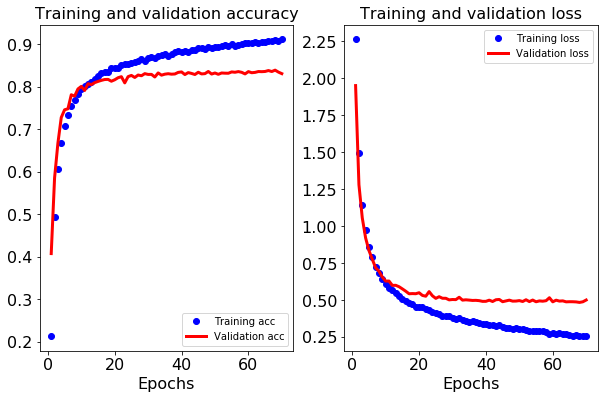

In [17]:
import matplotlib.pyplot as plt

fig, (ax1,ax2) = plt.subplots(1,2, figsize = (10,6))
epochs = range(1, len(history.history['acc']) + 1)
ax1.plot(epochs, history.history['acc'], 'bo', label='Training acc')
ax1.plot(epochs, history.history['val_acc'], 'r', label='Validation acc', linewidth = 3)
ax1.set_title('Training and validation accuracy', fontsize = 16)
ax1.set_xlabel('Epochs', fontsize = 16)

ax1.legend()

ax2.plot(epochs, history.history['loss'], 'bo', label='Training loss')
ax2.plot(epochs, history.history['val_loss'], 'r', label='Validation loss', linewidth = 3)
ax2.set_title('Training and validation loss', fontsize = 16)
ax2.set_xlabel('Epochs', fontsize = 16)
ax2.legend()

ax1.tick_params(labelsize=16)
ax2.tick_params(labelsize=16)

plt.show()

### WITH A VERY SIMPLE ARCHITECTURE AND RELATIVELY FEW PARAMETERS, WE ARE ABLE TO REACH VALIDATION ACCURACIES OF ~83%


After ~20 epochs, we start to overfit. As we have tried to mitigate overfitting with regularization, this means that we have hit the top performance with this network. Batch Normalization did not help much, as the network is not deep. To improve performance, one solution would be to increase its capacity by adding more layers or more units, or also try a bidirectinoal layer on top of the Conv1D, as explained before, which has 2x parameters as a regular LSTM. One could also try going beyond the Sequential model and use directed acyclic graphs or model ensembling. Because we are running this on CPU, we stop here.

## Model evaluation

Load the weights of the minimum validation loss and use that best model on the test_split data.

In [18]:
best_model = build_model_conv(len(word_index), max_len)
best_model.load_weights('obfuscated_weights.model.hdf5')
print('\nTesting loss: {:.4f}\nTesting accuracy: {:.4f}'.format(*best_model.evaluate(x_test_split, y_test_split)))

11/11 [==============================] - 0s 7ms/step - loss: 0.5228 - acc: 0.8313

Testing loss: 0.5228
Testing accuracy: 0.8313


Due to the class imbalance seen before, we will also construct a confusion matrix and a P-R curve for each class

In [19]:
#predicted probabilities by our model for each class
y_prob_predic = best_model.predict(x_test_split)
y_classes_split_predic = y_prob_predic.argmax(axis=1)
y_classes_split_actual = y_test_split.argmax(axis=1)

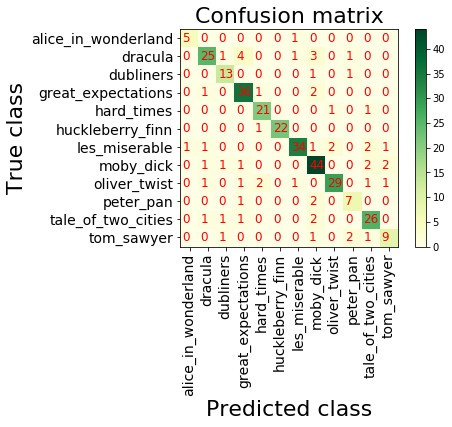

In [20]:
from sklearn.metrics import confusion_matrix

c_m = confusion_matrix(y_classes_split_actual,
                      y_classes_split_predic)

plt.imshow(c_m, cmap=plt.cm.YlGn)
plt.colorbar()
indexes = np.arange(len(novels))
for i in indexes:
    for j in indexes:
        plt.text(j - 0.4, i+0.2, c_m[i, j], fontsize = 12, color = 'red')
        
plt.xticks(indexes, novels, rotation=90, fontsize = 14)
plt.xlabel('Predicted class', fontsize = 22)
plt.yticks(indexes, novels, fontsize = 14)
plt.ylabel('True class', fontsize = 22)
plt.title('Confusion matrix', fontsize = 22)
plt.show()

Now we can calculate the Precision = TP / (TP + FP) and Recall = TP / (TP + FN) for a given class along the test_split dataset, varying the probability threshold for assuming a correct classification

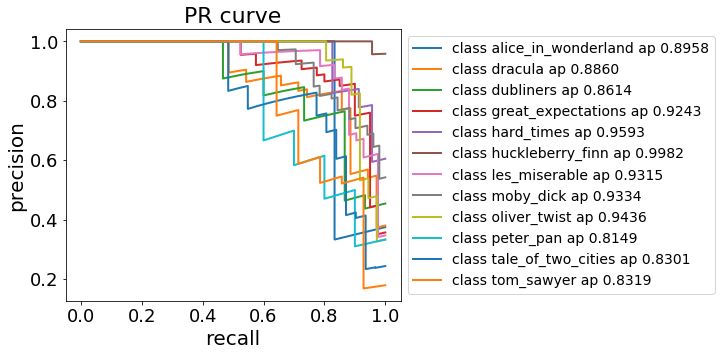

In [21]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

plt.figure(figsize=(6,5))
# precision recall curve
precision = dict()
recall = dict()
thresholds = dict()
ap = dict() #average precision
for i in range(12):
    precision[i], recall[i], thresholds[i] = precision_recall_curve(y_test_split[:, i],
                                                        y_prob_predic[:, i])
    
    #compute the average precision (AP) by calculating the are under the PR curve (AUC)
    ap[i] = average_precision_score(y_test_split[:,i], y_prob_predic[:,i])
    
    plt.plot(recall[i], precision[i], lw=2, label='class {}'.format(novels[i]) + ' ap {0:0.4f}'.format(ap[i]))
        
plt.xlabel("recall", fontsize = 20)
plt.ylabel("precision", fontsize = 20)
plt.legend(loc="center left", bbox_to_anchor = (1, 0.5), fontsize = 14)
plt.title("PR curve", fontsize = 22)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)

plt.show()

Compute the mean average PR: the average AP over all the classes

Average precision score, micro-averaged over all classes: 0.9190


Text(0.5, 1.0, 'mAP=0.91903')

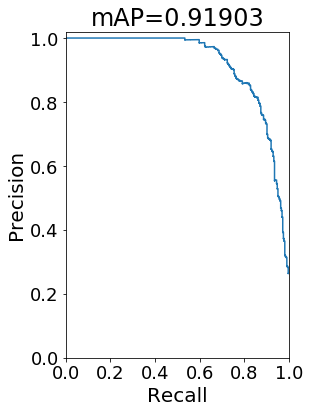

In [22]:
precision["micro"], recall["micro"], _ = precision_recall_curve(y_test_split.ravel(),
    y_prob_predic.ravel())

ap["micro"] = average_precision_score(y_test_split, y_prob_predic, average="micro")

print('Average precision score, micro-averaged over all classes: {0:0.4f}'
      .format(ap["micro"]))

plt.figure(figsize=(4,6))
plt.step(recall['micro'], precision['micro'], where='post')
plt.xlabel('Recall', fontsize = 20)
plt.ylabel('Precision', fontsize = 20)
plt.ylim([0., 1.02])
plt.xlim([0.0, 1.0])
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)

plt.title('mAP={0:0.5f}'.format(ap["micro"]), fontsize = 24)


## Obtaining predictions for the test set

The test set accuracy will be similar to the validation set accuracy, i.e. ~83%. However, we fine-tuned the hyperparamters of the network so the model performed well in the validation set, which means that it is likely that the accuracy in the test set will be slightly lower than this. In the small sample of test data we used we reached an accuracy of 83%. However, as the test data used contained only ~300 samples, the exact performance will depend on exactly which 300 samples we selected.


In [23]:
y_test_prob_pred = best_model.predict(x_test)
y_test_pred = y_test_prob_pred.argmax(axis = 1).astype('int16')
np.savetxt('ytest.txt', y_test_pred, fmt='%d')